Week 6 : Seasonal and Cancellation Analysis

In [0]:
'''
1. modify the cancelled column to change the values as 0 or 1
then use the random for assigning the values 
then for cancellation code use mapping technique to mapp the cancellation code 0 for not Cancelled(N) & 1 for cancelled

2. plot a bar chart for the cancellation by months 

3. plot a bar chart to show Cancellation Cause Type

4. Plot a graph for average Cancellation Rate: Winter vs Non-Winter

5 Use heatmap for Month vs Airline cancellation rates.

6. Airline Level- seasonal Cancellation rate analysis
'''

'\n1. modify the cancelled column to change the values as 0 or 1\nthen use the random for assigning the values \nthen for cancellation code use mapping technique to mapp the cancellation code 0 for not Cancelled(N) & 1 for cancelled\n\n2. plot a bar chart for the cancellation by months \n\n3. plot a bar chart to show Cancellation Cause Type\n\n4. Plot a graph for average Cancellation Rate: Winter vs Non-Winter\n\n5 Use heatmap for Month vs Airline cancellation rates.\n\n6. Airline Level- seasonal Cancellation rate analysis\n'

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly as px
import seaborn as sns

In [0]:
df=pd.read_csv("/Volumes/workspace/default/airlines/Flight_delay_processed.csv")
display(df)

Unnamed: 0,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Month,Hour,Route,Duration,TotalDelay,OnTime,DepHour
0,4,2019-01-03,1829,1959,1925,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore/Washington International Thurgood Marshall Airport,515,3,10,0,N,0,2,0,0,0,32,1,18,IND-BWI,1h 17m,68,0,18
1,4,2019-01-03,1937,2037,1940,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport (Las Vegas),1591,3,7,0,N,0,10,0,0,0,47,1,19,IND-LAS,3h 50m,124,0,19
2,4,2019-01-03,1644,1845,1725,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72,1,16,IND-MCO,1h 47m,174,0,16
3,4,2019-01-03,1452,1640,1625,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12,1,14,IND-PHX,3h 33m,42,0,14
4,4,2019-01-03,1323,1526,1510,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16,1,13,IND-TPA,1h 50m,44,0,13
5,4,2019-01-03,1416,1512,1435,WN,Southwest Airlines Co.,54,N643SW,56,70,49,37,51,ISP,Long Island MacArthur Airport,BWI,Baltimore/Washington International Thurgood Marshall Airport,220,2,5,0,N,0,12,0,0,0,25,1,14,ISP-BWI,0h 49m,88,0,14
6,4,2019-01-03,1657,1754,1735,WN,Southwest Airlines Co.,623,N724SW,57,70,47,19,32,ISP,Long Island MacArthur Airport,BWI,Baltimore/Washington International Thurgood Marshall Airport,220,5,5,0,N,0,7,0,0,0,12,1,16,ISP-BWI,0h 47m,51,0,16
7,4,2019-01-03,1422,1657,1610,WN,Southwest Airlines Co.,188,N215WN,155,195,143,47,87,ISP,Long Island MacArthur Airport,FLL,Fort Lauderdale–Hollywood International Airport,1093,6,6,0,N,0,40,0,0,0,7,1,14,ISP-FLL,2h 23m,134,0,14
8,4,2019-01-03,2107,2334,2230,WN,Southwest Airlines Co.,362,N798SW,147,165,134,64,82,ISP,Long Island MacArthur Airport,MCO,Orlando International Airport,972,6,7,0,N,0,5,0,0,0,59,1,21,ISP-MCO,2h 14m,146,0,21
9,4,2019-01-03,1812,1927,1815,WN,Southwest Airlines Co.,422,N779SW,135,145,118,72,82,ISP,Long Island MacArthur Airport,MDW,Chicago Midway International Airport,765,6,11,0,N,0,3,0,0,0,69,1,18,ISP-MDW,1h 58m,154,0,18


In [0]:
display(df.columns)

Index(['Unnamed: 0', 'DayOfWeek', 'Date', 'DepTime', 'ArrTime', 'CRSArrTime',
       'UniqueCarrier', 'Airline', 'FlightNum', 'TailNum', 'ActualElapsedTime',
       'CRSElapsedTime', 'AirTime', 'ArrDelay', 'DepDelay', 'Origin',
       'Org_Airport', 'Dest', 'Dest_Airport', 'Distance', 'TaxiIn', 'TaxiOut',
       'Cancelled', 'CancellationCode', 'Diverted', 'CarrierDelay',
       'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay',
       'Month', 'Hour', 'Route', 'Duration', 'TotalDelay', 'OnTime',
       'DepHour'],
      dtype='object')

In [0]:
# Extract 'DayOfWeek' and 'Month' from 'Date'
df['DayOfWeek'] = pd.to_datetime(df['Date']).dt.dayofweek + 1  # 1=Monday, 7=Sunday
df['Month'] = pd.to_datetime(df['Date']).dt.month

display(df[['Date', 'DayOfWeek', 'Month']])

In [0]:
import numpy as np

# Assign different cancellation probabilities for each month
month_cancel_probs = {
    1: 0.25,  # January - high cancellations (e.g., winter)
    2: 0.20,  # February - high
    3: 0.10,  # March - moderate
    4: 0.05,  # April - low
    5: 0.05,  # May - low
    6: 0.08,  # June - moderate
    7: 0.12,  # July - moderate
    8: 0.07,  # August - low
    9: 0.05,  # September - low
    10: 0.06, # October - low
    11: 0.18, # November - high (e.g., weather/holidays)
    12: 0.22  # December - high (e.g., winter/holidays)
}

# Generate cancellations based on month-specific probabilities
df['Cancelled'] = df['Month'].apply(lambda m: np.random.choice([0, 1], p=[1 - month_cancel_probs[m], month_cancel_probs[m]]))
display(df)

Unnamed: 0,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,Month,Hour,Route,Duration,TotalDelay,OnTime,DepHour
0,6,2019-07-27,1829,1959,1925,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore/Washington International Thurgood Marshall Airport,515,3,10,0,N,0,2,0,0,0,32,7,18,IND-BWI,1h 17m,68,0,18
1,5,2019-02-08,1937,2037,1940,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport (Las Vegas),1591,3,7,1,N,0,10,0,0,0,47,2,19,IND-LAS,3h 50m,124,0,19
2,6,2019-05-18,1644,1845,1725,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72,5,16,IND-MCO,1h 47m,174,0,16
3,3,2019-07-10,1452,1640,1625,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12,7,14,IND-PHX,3h 33m,42,0,14
4,3,2019-12-25,1323,1526,1510,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,1,N,0,0,0,0,0,16,12,13,IND-TPA,1h 50m,44,0,13
5,3,2019-01-23,1416,1512,1435,WN,Southwest Airlines Co.,54,N643SW,56,70,49,37,51,ISP,Long Island MacArthur Airport,BWI,Baltimore/Washington International Thurgood Marshall Airport,220,2,5,0,N,0,12,0,0,0,25,1,14,ISP-BWI,0h 49m,88,0,14
6,5,2019-02-15,1657,1754,1735,WN,Southwest Airlines Co.,623,N724SW,57,70,47,19,32,ISP,Long Island MacArthur Airport,BWI,Baltimore/Washington International Thurgood Marshall Airport,220,5,5,1,N,0,7,0,0,0,12,2,16,ISP-BWI,0h 47m,51,0,16
7,6,2019-03-09,1422,1657,1610,WN,Southwest Airlines Co.,188,N215WN,155,195,143,47,87,ISP,Long Island MacArthur Airport,FLL,Fort Lauderdale–Hollywood International Airport,1093,6,6,0,N,0,40,0,0,0,7,3,14,ISP-FLL,2h 23m,134,0,14
8,4,2019-11-21,2107,2334,2230,WN,Southwest Airlines Co.,362,N798SW,147,165,134,64,82,ISP,Long Island MacArthur Airport,MCO,Orlando International Airport,972,6,7,0,N,0,5,0,0,0,59,11,21,ISP-MCO,2h 14m,146,0,21
9,2,2019-12-03,1812,1927,1815,WN,Southwest Airlines Co.,422,N779SW,135,145,118,72,82,ISP,Long Island MacArthur Airport,MDW,Chicago Midway International Airport,765,6,11,0,N,0,3,0,0,0,69,12,18,ISP-MDW,1h 58m,154,0,18


In [0]:
def map_cancellation_code(row):
    if row['Cancelled'] == 0:
        return 'N'
    if row['CarrierDelay'] > 0:
        return 'A'
    if row['WeatherDelay'] > 0:
        return 'B'
    if row['NASDelay'] > 0:
        return 'C'
    if row['SecurityDelay'] > 0:
        return 'D'
    if row['LateAircraftDelay'] > 0:
        return 'E'
    return 'N'

df['CancellationCode'] = df.apply(map_cancellation_code, axis=1)
display(df[['Cancelled', 'CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay', 'CancellationCode']])

Cancelled,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,CancellationCode
0,2,0,0,0,32,N
1,10,0,0,0,47,A
0,8,0,0,0,72,N
0,3,0,0,0,12,N
1,0,0,0,0,16,E
0,12,0,0,0,25,N
1,7,0,0,0,12,A
0,40,0,0,0,7,N
0,5,0,0,0,59,N
0,3,0,0,0,69,N


In [0]:
import plotly.express as px

# Group by Month and sum cancellations
monthly_cancellations = df.groupby('Month')['Cancelled'].sum().reset_index()

# Map month numbers to names for better readability
month_map = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June',
    7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
monthly_cancellations['MonthName'] = monthly_cancellations['Month'].map(month_map)

# Sort by number of cancellations (height of bar)
monthly_cancellations = monthly_cancellations.sort_values('Cancelled', ascending=False)

fig = px.bar(
    monthly_cancellations,
    x='MonthName',
    y='Cancelled',
    labels={'MonthName': 'Month', 'Cancelled': 'Number of Cancellations'},
    title='Interactive Bar Plot: Cancellation Trend Over Months',
    color='MonthName'
)
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Cancellations',
    template='plotly_dark',
    showlegend=False
)
fig.show()

In [0]:
import plotly.express as px

# Map cancellation codes to reasons
reason_map = {
    'A': 'Carrier Delay',
    'B': 'Weather Delay',
    'C': 'NAS Delay',
    'D': 'Security Delay',
    'E': 'Late Aircraft Delay'
}

# Count cancellations by reason (excluding 'N' for not cancelled)
cause_counts = df[df['CancellationCode'] != 'N']['CancellationCode'].map(reason_map).value_counts().reset_index()
cause_counts.columns = ['CancellationReason', 'Count']

fig = px.bar(
    cause_counts,
    x='CancellationReason',
    y='Count',
    labels={'CancellationReason': 'Cancellation Reason', 'Count': 'Number of Cancellations'},
    title='Bar Chart: Cancellation Reason',
    color='CancellationReason'
)
fig.update_layout(
    xaxis_title='Cancellation Reason',
    yaxis_title='Number of Cancellations',
    template='plotly_dark',
    showlegend=False
)
fig.show()

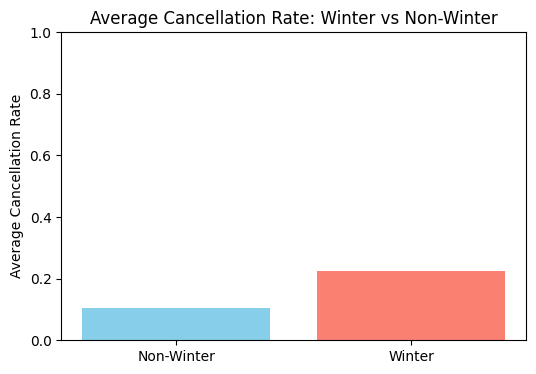

In [0]:
import matplotlib.pyplot as plt

# Define winter and non-winter months
winter_months = [12, 1, 2]
df['Season'] = df['Month'].apply(lambda m: 'Winter' if m in winter_months else 'Non-Winter')

# Calculate average cancellation rate for each season
seasonal_cancellation = df.groupby('Season')['Cancelled'].mean().reset_index()

# Plot
plt.figure(figsize=(6,4))
plt.bar(seasonal_cancellation['Season'], seasonal_cancellation['Cancelled'], color=['skyblue', 'salmon'])
plt.ylabel('Average Cancellation Rate')
plt.title('Average Cancellation Rate: Winter vs Non-Winter')
plt.ylim(0, 1)
plt.show()

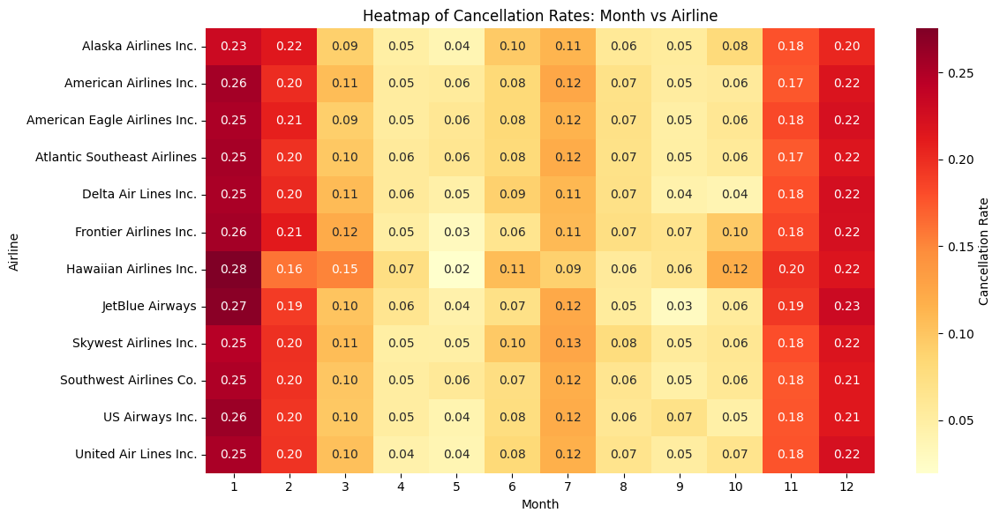

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate cancellation rate per Airline per Month
pivot = df.groupby(['Month', 'Airline'])['Cancelled'].mean().reset_index()
heatmap_data = pivot.pivot(index='Airline', columns='Month', values='Cancelled')

plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt=".2f",
    cmap="YlOrRd",
    cbar_kws={'label': 'Cancellation Rate'}
)
plt.title('Heatmap of Cancellation Rates: Month vs Airline')
plt.xlabel('Month')
plt.ylabel('Airline')
plt.tight_layout()
plt.show()

<Figure size 1000x1200 with 0 Axes>

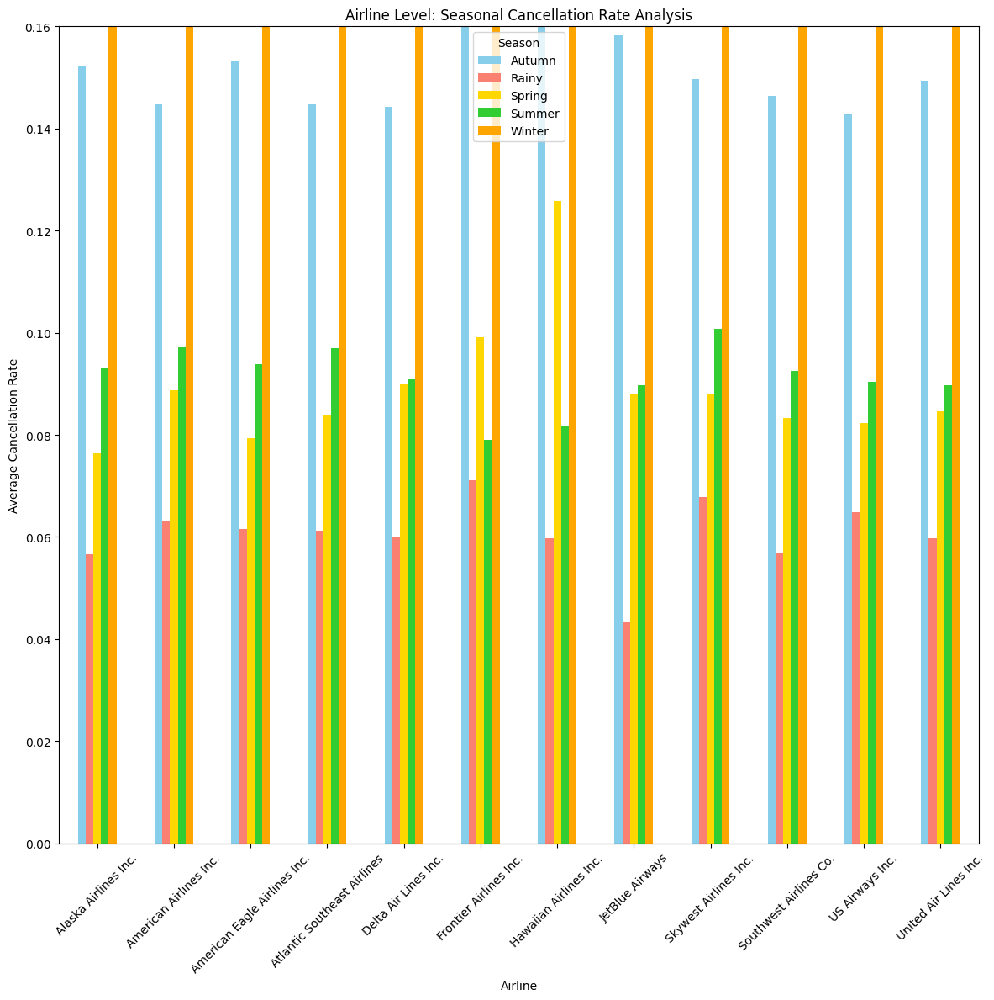

In [0]:
import numpy as np

# Define custom seasons
def assign_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4]:
        return 'Spring'
    elif month in [5, 6, 7]:
        return 'Summer'
    elif month in [8, 9]:
        return 'Rainy'
    elif month in [10, 11]:
        return 'Autumn'
    else:
        return 'Unknown'

df['Season'] = df['Month'].apply(assign_season)

# Calculate average cancellation rate per Airline per Season
airline_seasonal = df.groupby(['Airline', 'Season'])['Cancelled'].mean().reset_index()

# Pivot for better visualization
airline_seasonal_pivot = airline_seasonal.pivot(index='Airline', columns='Season', values='Cancelled')

yticks = np.arange(0, 0.18, 0.02)
plt.figure(figsize=(10, 12))  # Increased height
ax = airline_seasonal_pivot.plot(kind='bar', figsize=(12,12), color=['skyblue', 'salmon', 'gold', 'limegreen', 'orange'])
plt.ylabel('Average Cancellation Rate')
plt.title('Airline Level: Seasonal Cancellation Rate Analysis')
plt.ylim(0, 0.16)
plt.yticks(yticks, [f"{x:.2f}" for x in yticks])
plt.xticks(rotation=45)
plt.legend(title='Season')
plt.tight_layout()
plt.show()

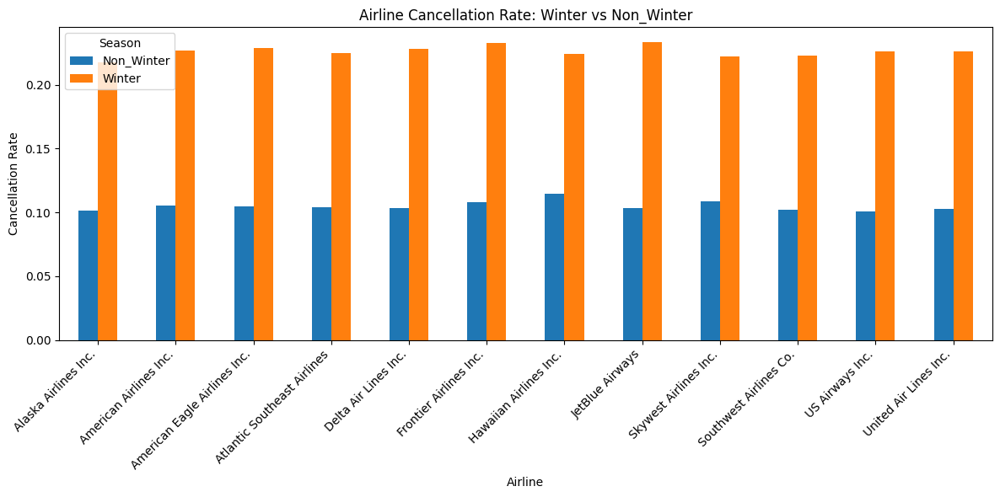

In [0]:
import matplotlib.pyplot as plt

winter_months = ['December', 'January', 'February']

# Ensure 'Date' is datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Extract month name
df['Month'] = df['Date'].dt.month_name()

# Assign season
df['Season'] = df['Month'].apply(
    lambda x: 'Winter' if x in winter_months else 'Non_Winter'
)

# Group and pivot
airline_season_cancel = df.groupby(
    ['Airline', 'Season']
)['Cancelled'].mean().reset_index()

pivot_airline_season = airline_season_cancel.pivot(
    index='Airline',
    columns='Season',
    values='Cancelled'
)

# Plot
pivot_airline_season.plot(
    kind='bar',
    figsize=(12, 6),
    title='Airline Cancellation Rate: Winter vs Non_Winter',
    ylabel='Cancellation Rate'
)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()